In [1]:
import numpy as np
import pandas as pd

import scanpy as sc
from collections import Counter
from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score, silhouette_score
from tqdm.auto import tqdm

#import scib

/data1/chenyx/anaconda3/envs/trvaep/lib/python3.7/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
from numba import set_num_threads

set_num_threads(16)

OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


In [3]:
#import trvae
import trvaep

In [4]:
ad_sampled = sc.read_h5ad('/data1/chenyx/sampled.raw.h5ad')

# 6. trVAE

In [15]:
method = "trvae"

## load data

In [10]:
adata = ad_sampled.copy()

In [11]:
conditions = adata.obs["Ref"].unique().tolist()

In [12]:
conditions

['10.1038/s41586-020-2797-4(2020)',
 '10.1161/CIRCULATIONAHA.119.045401',
 '10.1161/CIRCULATIONAHA.121.055690',
 '10.1038/s41586-020-2157-4']

## Create network

In [13]:
network = trvae.models.trVAE(x_dimension=adata.shape[1],
                             architecture=[256,64],
                             z_dimension=10,
                             gene_names=adata.var_names.tolist(),
                             conditions=conditions,
                             model_path='./models/trVAE/haber/',
                             alpha=0.0001,
                             beta=50,
                             eta=100,
                             loss_fn='sse',
                             output_activation='linear')









Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.


2022-05-20 20:40:48.086478: I tensorflow/core/platform/cpu_feature_guard.cc:142] Your CPU supports instructions that this TensorFlow binary was not compiled to use: AVX2 AVX512F FMA
2022-05-20 20:40:48.120557: I tensorflow/core/platform/profile_utils/cpu_utils.cc:94] CPU Frequency: 2200000000 Hz
2022-05-20 20:40:48.133474: I tensorflow/compiler/xla/service/service.cc:168] XLA service 0x561aef7455b0 initialized for platform Host (this does not guarantee that XLA will be used). Devices:
2022-05-20 20:40:48.133537: I tensorflow/compiler/xla/service/service.cc:176]   StreamExecutor device (0): Host, Default Version



trVAE' network has been successfully constructed!



Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
trVAE'snetwork has been successfully compiled!


## train network

In [19]:
network.train(adata,
              "Ref",
              train_size=0.8,
              n_epochs=50,
              batch_size=512,
              early_stop_limit=10,
              lr_reducer=20,
              verbose=5,
              save=True)





 |████████████████████| 100.0%  - loss: 8142.5865 - mmd_loss: 16.0925 - recon_loss: 8126.4939 - val_loss: 26301.1006 - val_mmd_loss: 33.5051 - val_recon_loss: 26267.5955

trVAE has been successfully saved in ./models/trVAE/haber/.


## Get latent result

In [21]:
latent_adata = network.get_latent(adata, "Ref")
latent_adata

AnnData object with n_obs × n_vars = 99567 × 10
    obs: 'cell_ID', 'donor_ID', 'donor_gender', 'donor_age', 'original_name', 'region', 'subregion', 'seq_tech', 'cell_type', 'seurat_cluster', 'ethnicity', 'Ref', 'MCT', 'PC_1', 'PC_2', 'TSNE_1', 'TSNE_2', 'UMAP_1', 'UMAP_2', 'n_genes'

In [22]:
sc.pp.neighbors(latent_adata)
sc.tl.umap(latent_adata)

findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.


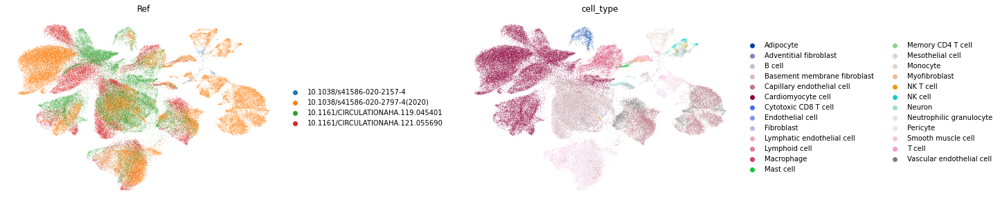

In [23]:
sc.pl.umap(latent_adata, color=["Ref", "cell_type"], wspace=0.5, frameon=False)

## Get corrected expression

In [24]:
target_condition = adata.obs["Ref"].value_counts().index[0]

In [25]:
corrected_data = network.predict(adata,"Ref",target_condition=target_condition)

In [27]:
sc.pp.scale(corrected_data,max_value=10)
sc.pp.pca(corrected_data)

sc.pp.neighbors(corrected_data,n_neighbors=10,n_pcs=40)
sc.tl.umap(corrected_data)

## save fig

findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.


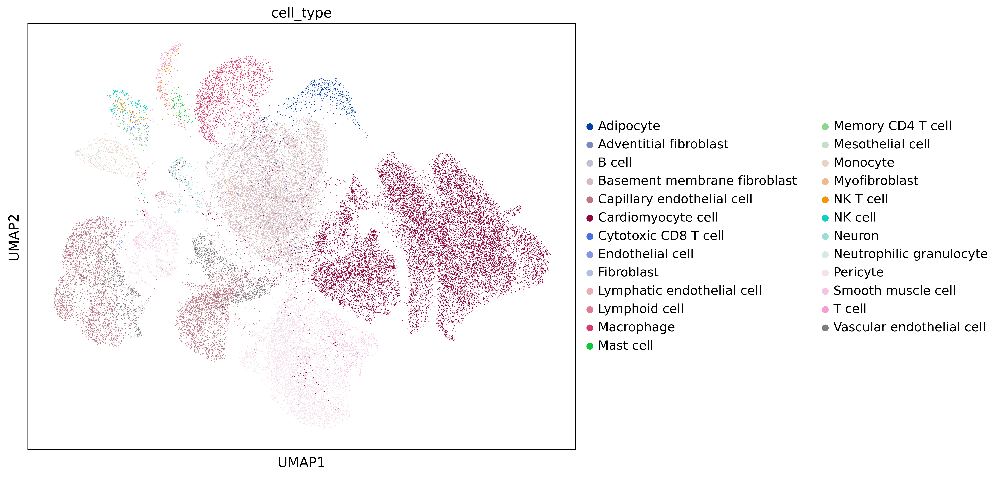

In [28]:
sc.set_figure_params(dpi=300)
fig = sc.pl.embedding(corrected_data, basis='umap', color="cell_type", return_fig=True)
fig.set_size_inches(10, 8)
fig.savefig(method + ".celltype.png", bbox_inches='tight')

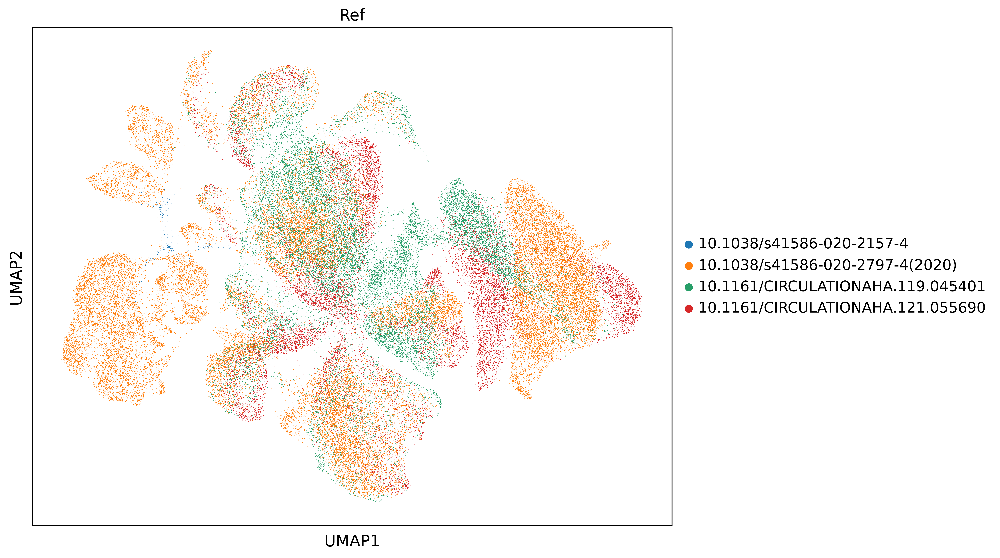

In [29]:
fig = sc.pl.embedding(corrected_data, basis='umap', color="Ref", return_fig=True)
fig.set_size_inches(10, 8)
fig.savefig(method + ".batch.png", bbox_inches='tight')

## save coordinates and adata

In [30]:
print('Saving embedding coordinates...')
corrected_data.obs["UMAP" + '1'] = corrected_data.obsm['X_' + 'umap'][:, 0]
corrected_data.obs["UMAP" + '2'] = corrected_data.obsm['X_' + 'umap'][:, 1]
coords = corrected_data.obs[["cell_type", "Ref", "UMAP" + '1', "UMAP" + '2']]
coords.to_csv(method + ".UMAP.csv", index_label='CellID')

Saving embedding coordinates...


In [31]:
corrected_data.write('/data1/chenyx/processed.trVAE.h5ad')
del adata

# 7. trvaep

In [5]:
method = "trvaep"
adata =  ad_sampled.copy()

In [6]:
import trvaep

## Integration

In [6]:
adata.X = adata.X.todense()

In [7]:
n_conditions = adata.obs["Ref"].unique().shape[0]
condition_key = "Ref"

In [8]:
model = trvaep.CVAE(adata.n_vars, num_classes=n_conditions,
            output_activation="ReLU", encoder_layer_sizes=[64, 32], decoder_layer_sizes=[32, 64], use_mmd=True, beta=1)
trainer = trvaep.Trainer(model, adata, condition_key=condition_key)

In [11]:
trainer.train_trvae(n_epochs=300, batch_size=1024, early_patience=50,)

Epoch 00/300 Batch 0000/82, Loss:  716.0081, rec_loss:  713.4391, KL_loss:    0.0057, MMD_loss:     2.5633


KeyboardInterrupt: 

In [ ]:
1

## calculate umap

In [ ]:
latent_y = model.get_y(
    adata.X, c=model.label_encoder.transform(adata.obs["Ref"]),use_gpu=False)
adata_latent = sc.AnnData(latent_y)
adata_latent.obs["cell_label"] = adata.obs["cell_label"].tolist()
adata_latent.obs[condition_key] = adata.obs[condition_key].tolist()
sc.pp.neighbors(adata_latent)
sc.tl.umap(adata_latent)

## save fig

In [ ]:
sc.set_figure_params(dpi=300)
fig = sc.pl.embedding(adata, basis='umap', color="cell_type", return_fig=True)
fig.set_size_inches(10, 8)
fig.savefig(method + ".celltype.png", bbox_inches='tight')

In [ ]:
fig = sc.pl.embedding(adata, basis='umap', color="Ref", return_fig=True)
fig.set_size_inches(10, 8)
fig.savefig(method + ".batch.png", bbox_inches='tight')

## save coordinates and adata

In [ ]:
print('Saving embedding coordinates...')
adata.obs[label + '1'] = adata.obsm['X_' + basis][:, 0]
adata.obs[label + '2'] = adata.obsm['X_' + basis][:, 1]
coords = adata.obs[["cell_type", "Ref", label + '1', label + '2']]
coords.to_csv(method + ".UMAP.csv", index_label='CellID')

In [ ]:
adata.write('/data1/chenyx/processed.trvaep.h5ad')
del adata